In [1]:
import os
import cv2

from utils.OpticalFlowUtils import FlowReader
from utils.OpticalFlowUtils import FlowVisualiser

from assets.ml.src.CustomLosses import EPE_Loss

2024-01-04 18:53:52.751585: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
reader = FlowReader()
visualiser = FlowVisualiser()

In [3]:
SINTEL_PATH = os.path.join("..", "Data", "MPI-Sintel")
SINTEL_TRAINING_PATH = os.path.join(SINTEL_PATH, "training")
SINTEL_TRAINING_FLOW_PATH = os.path.join(SINTEL_TRAINING_PATH, "flow")
SINTEL_TRAINING_IMG_PATH = os.path.join(SINTEL_TRAINING_PATH, "clean")

In [4]:
print(f"SINTEL PATH: {SINTEL_PATH}")
print(f"SINTEL TRAINING PATH: {SINTEL_TRAINING_PATH}")
print(f"SINTEL TRAINING FLOW PATH: {SINTEL_TRAINING_FLOW_PATH}")
print(f"SINTEL TRAINING IMG PATH: {SINTEL_TRAINING_IMG_PATH}")

SINTEL PATH: ../Data/MPI-Sintel
SINTEL TRAINING PATH: ../Data/MPI-Sintel/training
SINTEL TRAINING FLOW PATH: ../Data/MPI-Sintel/training/flow
SINTEL TRAINING IMG PATH: ../Data/MPI-Sintel/training/clean


In [5]:
for root, dirs, files in os.walk(SINTEL_TRAINING_IMG_PATH):
    print(f"Root: {root}, directories: {dirs}, number of files: {len(files)}")

Root: ../Data/MPI-Sintel/training/clean, directories: ['ambush_7', 'sleeping_1', 'ambush_6', 'alley_1', 'cave_2', 'cave_4', 'market_2', 'market_5', 'bamboo_2', 'mountain_1', 'shaman_2', 'bandage_1', 'shaman_3', 'sleeping_2', 'ambush_4', 'ambush_2', 'ambush_5', 'temple_3', 'alley_2', 'temple_2', 'market_6', 'bamboo_1', 'bandage_2'], number of files: 1
Root: ../Data/MPI-Sintel/training/clean/ambush_7, directories: [], number of files: 50
Root: ../Data/MPI-Sintel/training/clean/sleeping_1, directories: [], number of files: 50
Root: ../Data/MPI-Sintel/training/clean/ambush_6, directories: [], number of files: 20
Root: ../Data/MPI-Sintel/training/clean/alley_1, directories: [], number of files: 50
Root: ../Data/MPI-Sintel/training/clean/cave_2, directories: [], number of files: 50
Root: ../Data/MPI-Sintel/training/clean/cave_4, directories: [], number of files: 50
Root: ../Data/MPI-Sintel/training/clean/market_2, directories: [], number of files: 50
Root: ../Data/MPI-Sintel/training/clean/m

In [6]:
testPath = os.path.join(SINTEL_TRAINING_FLOW_PATH, 'alley_1')
testFlow = os.path.join(testPath, "frame_0001.flo")
testImg = os.path.join(SINTEL_TRAINING_IMG_PATH, 'alley_1', 'frame_0001.png')

flow = reader.readFlow(testFlow)
img = cv2.imread(testImg)

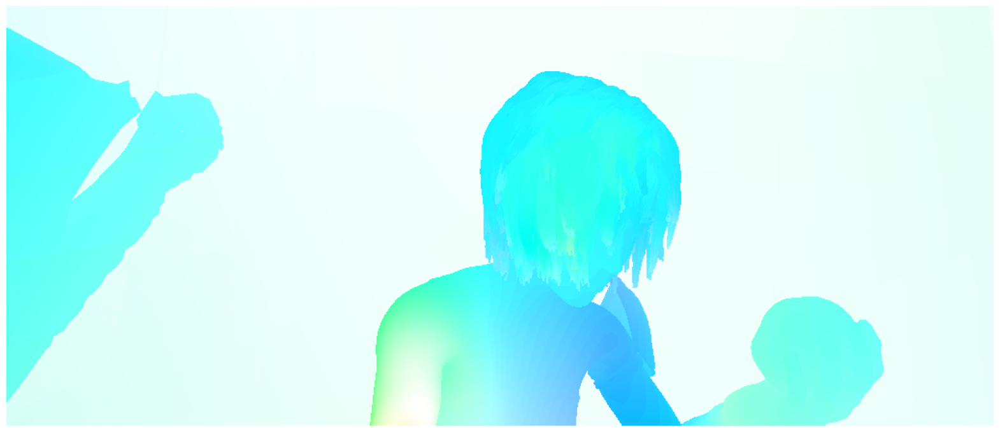

In [7]:
visualiser.visualiseOpticalFlow(flow)

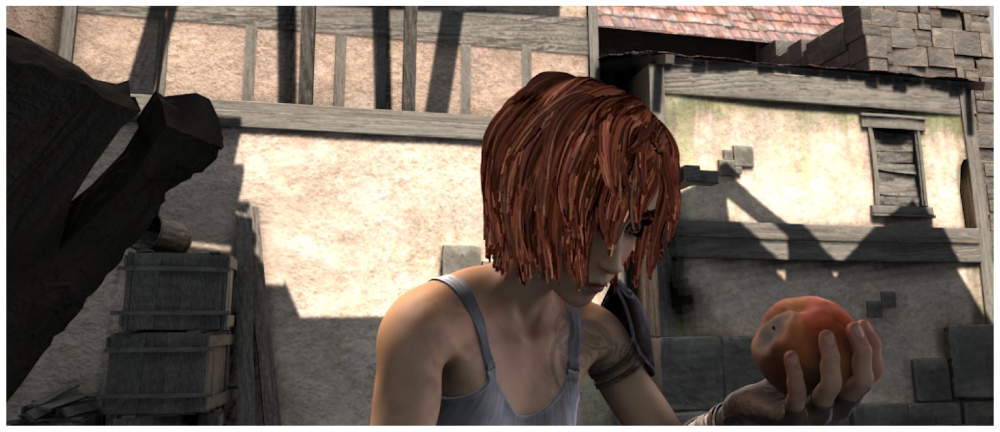

In [8]:
visualiser.imshow(img)

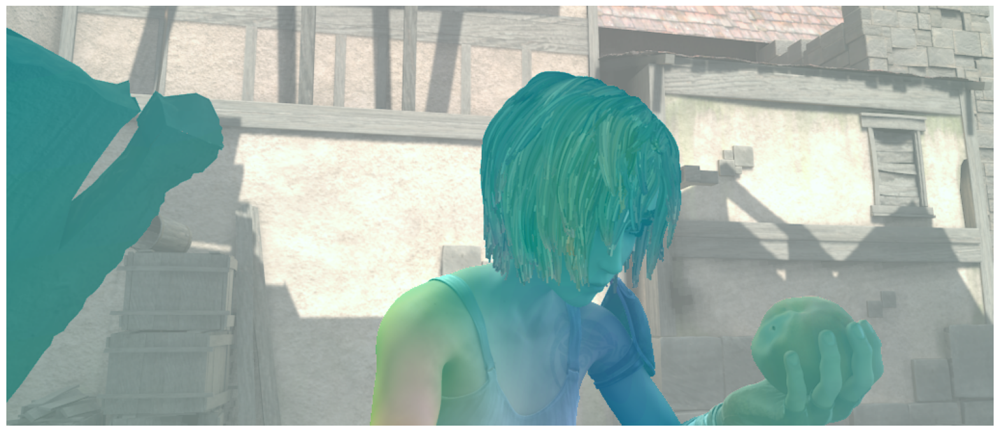

In [9]:
visualiser.visualiseOpticalFlow(flow, img)

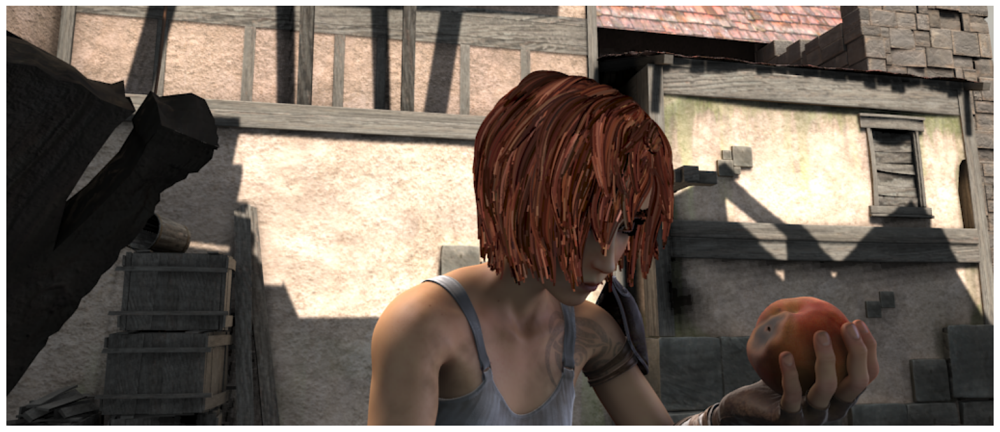

In [10]:
# Test Farneback Optical Flow and use that as one of the baselines to beat.

prev = img.copy()
next = cv2.imread(os.path.join(SINTEL_TRAINING_IMG_PATH, 'alley_1', 'frame_0002.png'))
visualiser.imshow(next)

In [11]:
print(f"Previous Frame shape: {prev.shape}")
print(f"Next frame shape: {next.shape}")

prev = cv2.cvtColor(prev, cv2.COLOR_BGR2GRAY)
next = cv2.cvtColor(next, cv2.COLOR_BGR2GRAY)

print(f"Previous Frame shape: {prev.shape}")
print(f"Next frame shape: {next.shape}")

farnebackFlow = cv2.calcOpticalFlowFarneback(prev, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

print(f"FarnebackFlow shape: {farnebackFlow.shape}")

Previous Frame shape: (436, 1024, 3)
Next frame shape: (436, 1024, 3)
Previous Frame shape: (436, 1024)
Next frame shape: (436, 1024)
FarnebackFlow shape: (436, 1024, 2)


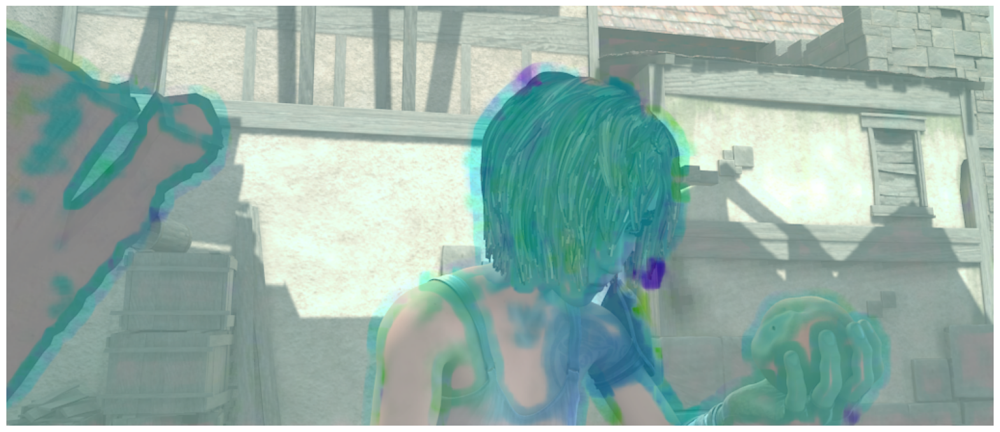

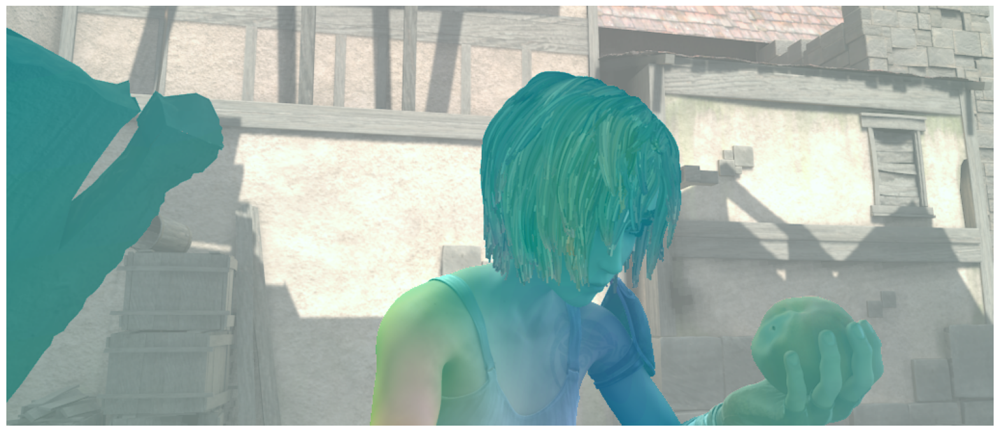

In [12]:
visualiser.visualiseOpticalFlow(farnebackFlow, image=img)
visualiser.visualiseOpticalFlow(flow, image = img)

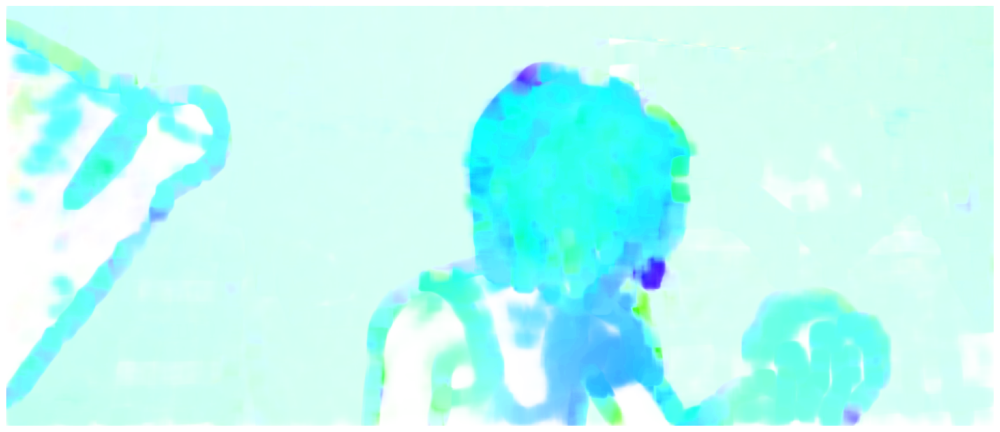

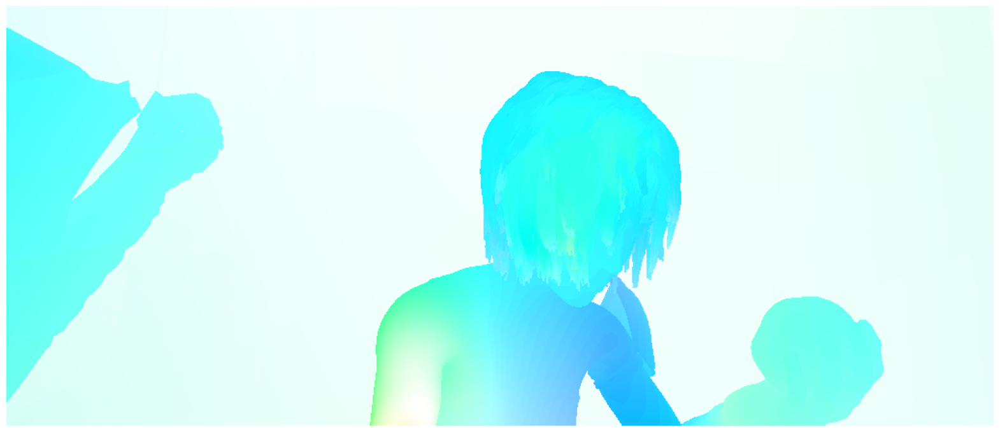

In [13]:
visualiser.visualiseOpticalFlow(farnebackFlow, image=None)
visualiser.visualiseOpticalFlow(flow, image = None)

In [14]:
# It appears that the normed variant using tf.norm reports incorrect values?
EPELoss = EPE_Loss()
alt = EPELoss(flow.reshape(1, flow.shape[0], flow.shape[1], flow.shape[2]), farnebackFlow.reshape(1, farnebackFlow.shape[0], farnebackFlow.shape[1], farnebackFlow.shape[2]))
epe = EPELoss.normedEPE(flow, farnebackFlow)
altepe = EPELoss.altNormedEPE(flow, farnebackFlow)
print(f"EPE: {epe.numpy()} vs. Alt EPE: {alt.numpy()} vs. Alt Normed-EPE: {altepe.numpy()}")

EPE: 1225.8450927734375 vs. Alt EPE: 0.8731475472450256 vs. Alt Normed-EPE: 1549.8187255859375


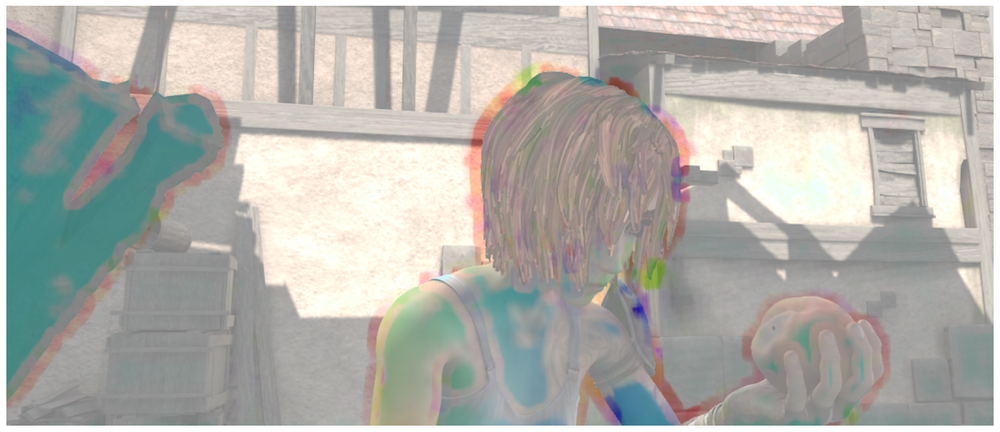

In [15]:
visualiser.visualiseFlowError(groundTruth=flow, predicted=farnebackFlow, image=img)

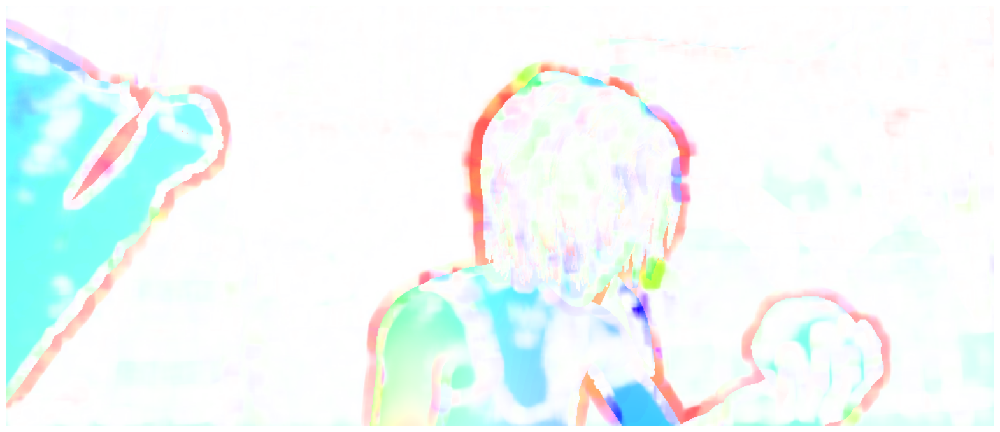

In [16]:
visualiser.visualiseFlowError(groundTruth=flow, predicted=farnebackFlow, image=None)